<a href="https://colab.research.google.com/github/itzahs/SSL-for-RS/blob/main/4_1_ModelInference_Classification_SSL4RS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🚀 **Semi-Supervised Learning for Remote Sensing (SSL4RS) Workshop** 🛰️

## 📂 Section 1 - Get Data & Software: Dataset Download & Augmentation
## 🛠️ Section 2 - Train Model: Implementing FixMatch Algorithm with PyTorch
## 📊 Section 3 - Model Evaluation: Analyzing Accuracy & Computational Cost from Log Files
## 📈 Section 4 - Model Inference: Classification Accuracy and Embeddings Visualization

### 📚 Setting Up the Working Folder & Importing Required Packages


In [ ]:
from google.colab import drive

# Mount google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Standard Library Imports
import os
import sys

# Third-Party Imports
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchsummary import summary
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, average_precision_score
from torchvision.transforms.functional import to_pil_image
import os

In [ ]:
#  Monitor the GPU usage
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
## Install the required libraries
%%capture
!pip install mmcv-lite # the version used to be mmcv-full and now it's mmcv-lite
!pip install torch torchvision torchaudio
!pip install apex
!pip install tensorboardX
!pip install tensorboard
!pip install tensorrt
!pip install tqdm

In [ ]:
# Set working folder as default
%cd "/content/drive/MyDrive/SSL4RS/Classification-SemiCLS"

# Append the parent directory (Classification-SemiCLS) to sys.path:
# The list in Python that specifies the directories for modules and packages to import.
sys.path.append('/content/drive/MyDrive/SSL4RS/Classification-SemiCLS')

# Path to the model checkpoint and configuration
model_folder = './results/fm_ucm_wres_x2_b1x8_l840'
model_best_path = model_folder+'/fm_ucm_wres_x2_b1x8_l840.tar'       #checkpoint to the best model from all the epochs trained
config_path = model_folder+'/fm_ucm_wres_x2_b1x8_l840.py'                #configuration file used to train the model

/content/drive/MyDrive/SSL4RS/Classification-SemiCLS


# Evaluating the model using confusion matrix, precision and recall

### Read configuration file and best model checkpoint

In [ ]:
from mmengine.config import Config

# Read the configuration file
cfg = Config.fromfile(config_path)

# Extract the input size from the vpipeline section
input_size = cfg.data.vpipeline[1]['size']

# Print a summary of the configuration
#print(cfg.pretty_text) #for prettier version
cfg

Config (path: ./results/fm_ucm_wres_x2_b1x8_l840/fm_ucm_wres_x2_b1x8_l840.py): {'train': {'eval_step': 1024, 'total_steps': 204800, 'trainer': {'type': 'FixMatch', 'threshold': 0.95, 'T': 1.0, 'lambda_u': 1.0, 'loss_x': {'type': 'cross_entropy', 'reduction': 'mean'}, 'loss_u': {'type': 'cross_entropy', 'reduction': 'none'}}}, 'num_classes': 21, 'model': {'type': 'wideresnet', 'depth': 28, 'widen_factor': 2, 'dropout': 0, 'num_classes': 21}, 'ucm_mean': (0.485, 0.456, 0.406), 'ucm_std': (0.229, 0.224, 0.225), 'data': {'type': 'MyDataset', 'num_workers': 0, 'num_labeled': 840, 'num_classes': 21, 'batch_size': 8, 'expand_labels': False, 'mu': 7, 'root': './data/UCM/Images', 'labeled_names_file': './data/UCM/Images/UCM_train.txt', 'test_names_file': './data/UCM/Images/UCM_test.txt', 'lpipelines': [[{'type': 'RandomHorizontalFlip', 'p': 0.5}, {'type': 'RandomResizedCrop', 'size': 224, 'scale': (0.2, 1.0)}, {'type': 'ToTensor'}, {'type': 'Normalize', 'mean': (0.485, 0.456, 0.406), 'std': (0.

In [ ]:
from models import builder as model_builder

# Load the model state dictionary from the checkpoint of the best model
best_model = torch.load(model_best_path, map_location=torch.device('cpu'))

# Print all keys in the checkpoint of the best model
print(best_model.keys())

# Print some information of the model
print("Best model was obtained on the epoch:", best_model['epoch'])
print("The best top-1 accuracy corresponds to:", best_model['best_acc'])

# You can also loop through all the keys and print their values
#for key, value in best_model.items():
#    print(f"Key: {key}, Value: {value}")

dict_keys(['epoch', 'state_dict', 'ema_state_dict', 'acc', 'best_acc', 'optimizer', 'scheduler'])
Best model was obtained on the epoch: 200
The best top-1 accuracy corresponds to: 94.47619047619048


### Load best model

In [ ]:
# Create the model architecture from the configuration file
model = model_builder.build(cfg.model)

# Load the model state dictionary from the checkpoint
model.load_state_dict(best_model['state_dict'])

# Move the model to the appropriate device (CPU or GPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Print model summary
summary(model, input_size=(3, input_size, input_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 224, 224]             432
       BatchNorm2d-2         [-1, 16, 224, 224]              32
         LeakyReLU-3         [-1, 16, 224, 224]               0
            Conv2d-4         [-1, 32, 224, 224]           4,608
       BatchNorm2d-5         [-1, 32, 224, 224]              64
         LeakyReLU-6         [-1, 32, 224, 224]               0
            Conv2d-7         [-1, 32, 224, 224]           9,216
            Conv2d-8         [-1, 32, 224, 224]             512
        BasicBlock-9         [-1, 32, 224, 224]               0
      BatchNorm2d-10         [-1, 32, 224, 224]              64
        LeakyReLU-11         [-1, 32, 224, 224]               0
           Conv2d-12         [-1, 32, 224, 224]           9,216
      BatchNorm2d-13         [-1, 32, 224, 224]              64
        LeakyReLU-14         [-1, 32, 2

### Prepare testing dataset

In [ ]:
from dataset.transforms.builder import BaseTransform
from dataset.MyDataset import MyDataset
from torch.utils.data import DataLoader, SequentialSampler

# Load the validation transformations from the configuration file
transform_val = BaseTransform(cfg.data.vpipeline)
# Print the pipeline attribute
print(transform_val.pipeline)

# make dataset (dataset_builder.build)
test_dataset = MyDataset(names_file=cfg.data.test_names_file, transform=transform_val)

# make dataset loader (train_semi.get_dataloader)
test_loader = DataLoader(test_dataset,
                          sampler=SequentialSampler(test_dataset), #SequentialSampler for testing and RandomSampler for training
                          batch_size=cfg.data.batch_size,
                          #num_workers=cfg.data.num_workers, #ideally import from config file
                          num_workers=2)  # Adjusted value based on colab system)

[{'type': 'Resize', 'size': 256}, {'type': 'CenterCrop', 'size': 224}, {'type': 'ToTensor'}, {'type': 'Normalize', 'mean': (0.485, 0.456, 0.406), 'std': (0.229, 0.224, 0.225)}]


In [ ]:
# Create an iterator for the DataLoader
test_loader_iter = iter(test_loader)

# Fetch a batch of data from the iterator
batch_data, batch_labels = next(test_loader_iter)

# Now you can examine the batch_data and batch_labels
# For example, print the shape of the batch_data and batch_labels
print("Batch data shape:", batch_data.shape)
print("Batch labels shape:", batch_labels.shape)
print(batch_labels)

Batch data shape: torch.Size([8, 3, 224, 224])
Batch labels shape: torch.Size([8])
tensor([0, 0, 0, 0, 0, 0, 0, 0])


### Perform inference

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, cohen_kappa_score

# Set the model to evaluation mode
model.eval()

all_predictions = []
all_labels = []

# Perform inference and calculate metrics
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Forward pass
        # Class probabilities for each sample in the batch
        outputs_tuple = model(inputs) # [batch_size, num_classes] torch.Size([8, 21])

        # Get highest prediction per sample and assign label
        argmax_dim1, predicted = torch.max(outputs_tuple, 1) # tensor([18.2504, 17.0848, 16.0119, 13.5324, 23.9052, 18.9193, 16.4092, 15.3505]) tensor([0, 0, 0, 0, 0, 0, 0, 0])

        #convert predicted tensor containing class labels for each input sample into an array
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate confusion matrix
conf_matrix = confusion_matrix(all_labels, all_predictions)

# Calculate precision and recall
precision = precision_score(all_labels, all_predictions, average=None)
recall = recall_score(all_labels, all_predictions, average=None)

# Calculate Cohen's Kappa
kappa = cohen_kappa_score(all_labels, all_predictions)

# Print or use the calculated metrics as needed
print("Confusion Matrix:")
print(conf_matrix)
print("\nPrecision:", precision)
print("\nRecall:", recall)
print("\nCohen's Kappa:", kappa)


Confusion Matrix:
[[48  0  0  0  0  0  0  0  0  1  0  0  1  0  0  0  0  0  0  0  0]
 [ 0 49  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0]
 [ 0  0 50  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 50  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1 41  0  4  0  0  0  0  1  0  0  0  0  0  0  2  1  0]
 [ 0  0  0  0  0 49  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0]
 [ 0  0  3  0  0  0 39  0  0  0  0  7  1  0  0  0  0  0  0  0  0]
 [ 5  0  0  0  0  0  0 45  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0  0  0  0  0  0 49  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  1  0  0  0  0  0  0 46  0  0  0  0  0  0  2  0  0  0  0]
 [ 0  0  0  1  0  0  0  0  0  0 48  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  1  0  2  0  0 44  0  0  1  0  0  0  1  0  0]
 [ 0  0  0  0  0  0  2  0  0  0  0  4 29  0  0  0  1  0 14  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0  1  1 44  0  0  0  0  3  0  0]
 [ 0  0  0  0  0  0  0  0  2  0  0  0  0  0 48  0  0  0  0

In [ ]:
# Get the names of the classes
# Get subfolders path
folders = sorted([f.path for f in os.scandir(cfg.data.root) if f.is_dir()])

# Create dictionary where keys are the string of the class and value the integer
classes_dict = {}
for i, folder in enumerate(folders):
    folder_name = os.path.basename(folder)
    classes_dict[folder_name] = i

# Create a reverse dictionary to map integer labels back to class names
label_to_class = {v: k for k, v in classes_dict.items()}

# Replace numeric labels with class names for all_labels and all_predictions
all_labels_names = [label_to_class[label] for label in all_labels]
all_predictions_names = [label_to_class[label] for label in all_predictions]

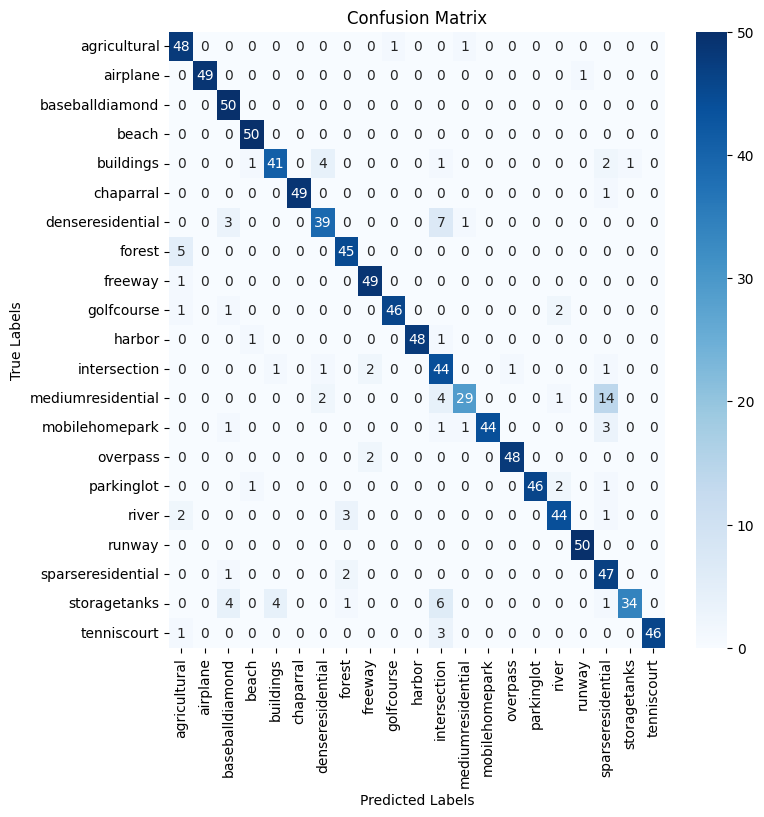

Precision:
[0.82758621 1.         0.83333333 0.94339623 0.89130435 1.
 0.84782609 0.88235294 0.9245283  0.9787234  1.         0.65671642
 0.90625    1.         0.97959184 1.         0.89795918 0.98039216
 0.66197183 0.97142857 1.        ]

Recall:
[0.96 0.98 1.   1.   0.82 0.98 0.78 0.9  0.98 0.92 0.96 0.88 0.58 0.88
 0.96 0.92 0.88 1.   0.94 0.68 0.92]

Cohen's Kappa: 0.896


In [ ]:
# Visualize the confusion matrix using Seaborn heatmap
plt.figure(figsize=(8, 8))

#sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues') # numerical names
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes_dict, yticklabels=classes_dict) # string names
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Print precision and recall for each class
print("Precision:")
print(precision)
print("\nRecall:")
print(recall)

# Print Cohen's Kappa
print("\nCohen's Kappa:", kappa)

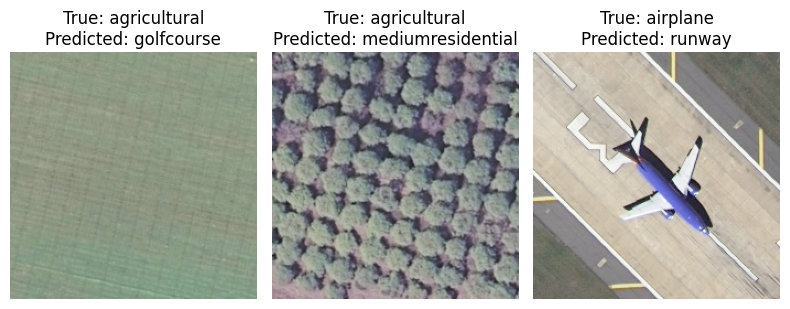

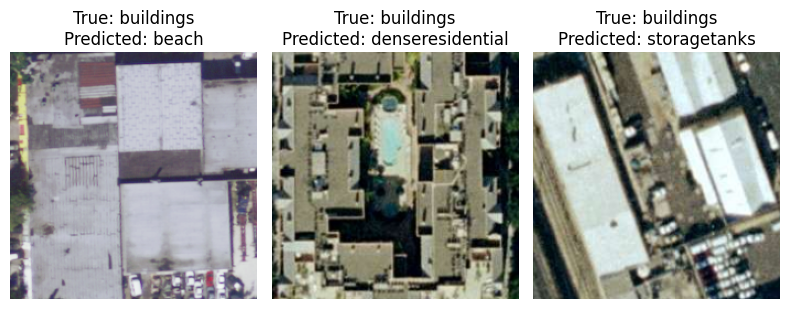

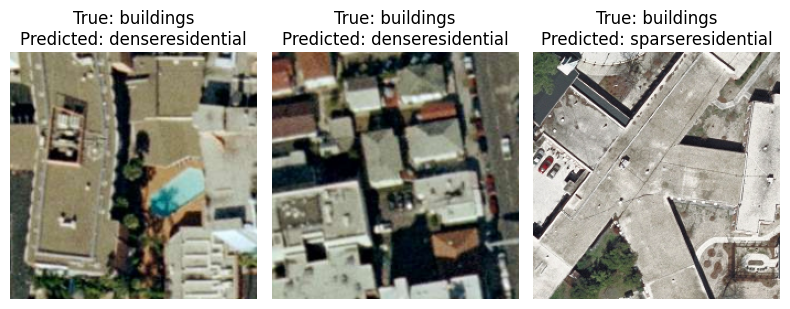

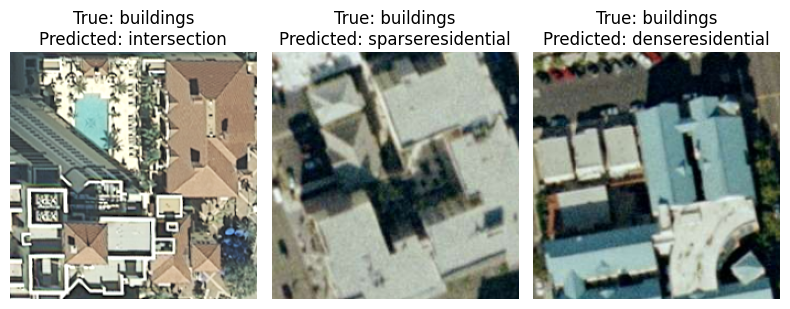

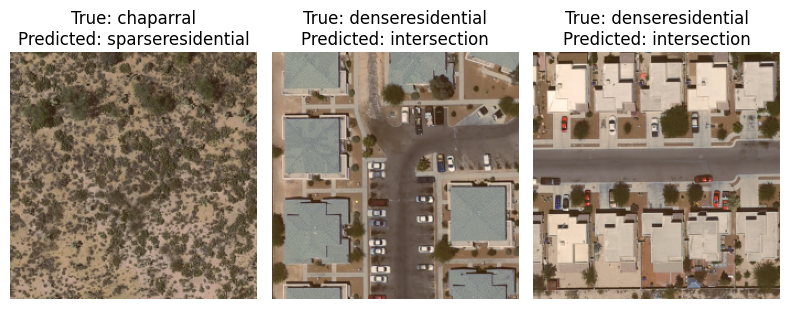

...

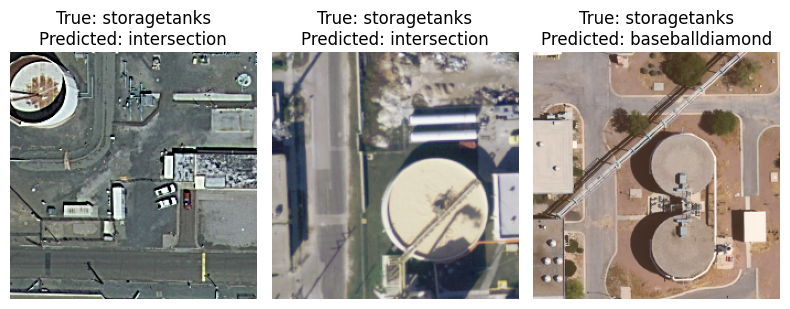

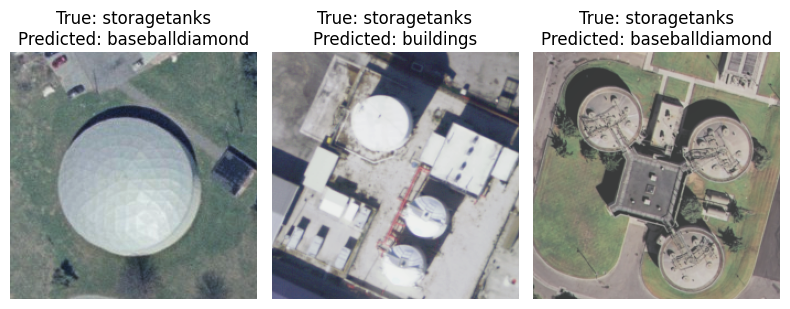

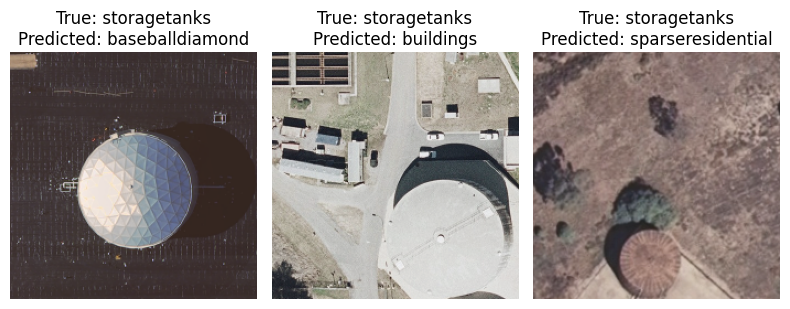

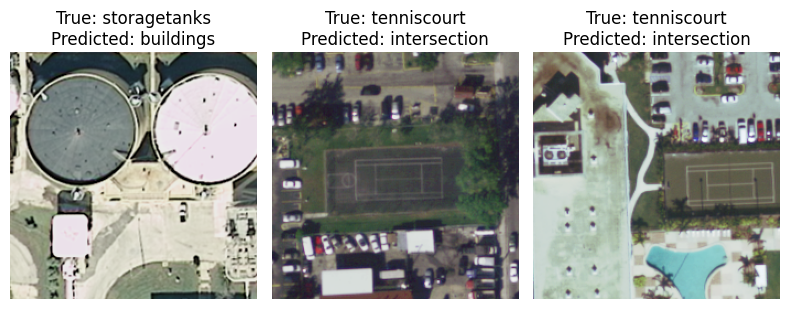

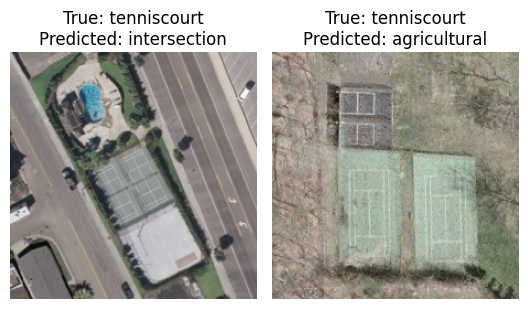

In [ ]:
# Create a directory to save the misclassified images
output_dir = "./results/misclassified_images/UCM"
os.makedirs(output_dir, exist_ok=True)

# Create test dataset without normalization for visualization purposes
transform_val_without_normalize = BaseTransform(cfg.data.vpipeline[:-1])
test_dataset_pil = MyDataset(names_file=cfg.data.test_names_file, transform=transform_val_without_normalize)

# Identify misclassified indices
misclassified_indices = np.where(np.array(all_labels) != np.array(all_predictions))[0]

# Number of images to show per row
images_per_row = 3

# Iterate over misclassified examples
for i in range(0, len(misclassified_indices), images_per_row):
    plt.figure(figsize=(8, 8))  # Adjust the figure size as needed

    for j in range(images_per_row):
        index = i + j
        if index < len(misclassified_indices):
            misclassified_index = misclassified_indices[index]
            input_image, true_label_numeric = test_dataset_pil[misclassified_index]
            true_label = label_to_class[true_label_numeric]
            predicted_label = all_predictions_names[misclassified_index]

            # Convert input_image to PIL Image
            input_image = to_pil_image(input_image.cpu())

            # Display the image with labels
            plt.subplot(1, images_per_row, j + 1)
            plt.imshow(input_image)
            plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
            plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Save the entire plot as an image
    plot_filename = os.path.join(output_dir, f'misclassified_plot_{i}.png')
    plt.savefig(plot_filename)
    plt.close()  # Close the plot to release memory